# Exploring A Diffusion Model in Pytorch
## Problem Set 2 - Task 5
## COSC 4368 - Spring 2024
### Raunak Sarbajna

In this notebook we build a very simple Diffusion Model for generating car images using the Stanford Car dataset. 

You are expected to *follow the instructions given in the specifications word doc* and modify the coding cells as directed.
Your explanations should be in text blocks following the code.


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


## Investigating the dataset

As dataset we use the StanfordCars Dataset, which consists of around 8000 images in the train set.
You will need to download the dataset from Teams or from the link below, and unzip it *in the same directory as your notebook*.

Dataset: https://drive.google.com/file/d/1NF-JNSVkdu_lG7UVVtTAUMWIRQANqtav/view?usp=sharing

In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt

class StanfordCars(torch.utils.data.Dataset):
    def __init__(self, root_path, transform = None):
        self.images = [os.path.join(root_path, file) for file in os.listdir(root_path)]
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image_file = self.images[index]
        image = Image.open(image_file).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image[None]
  

#load Data

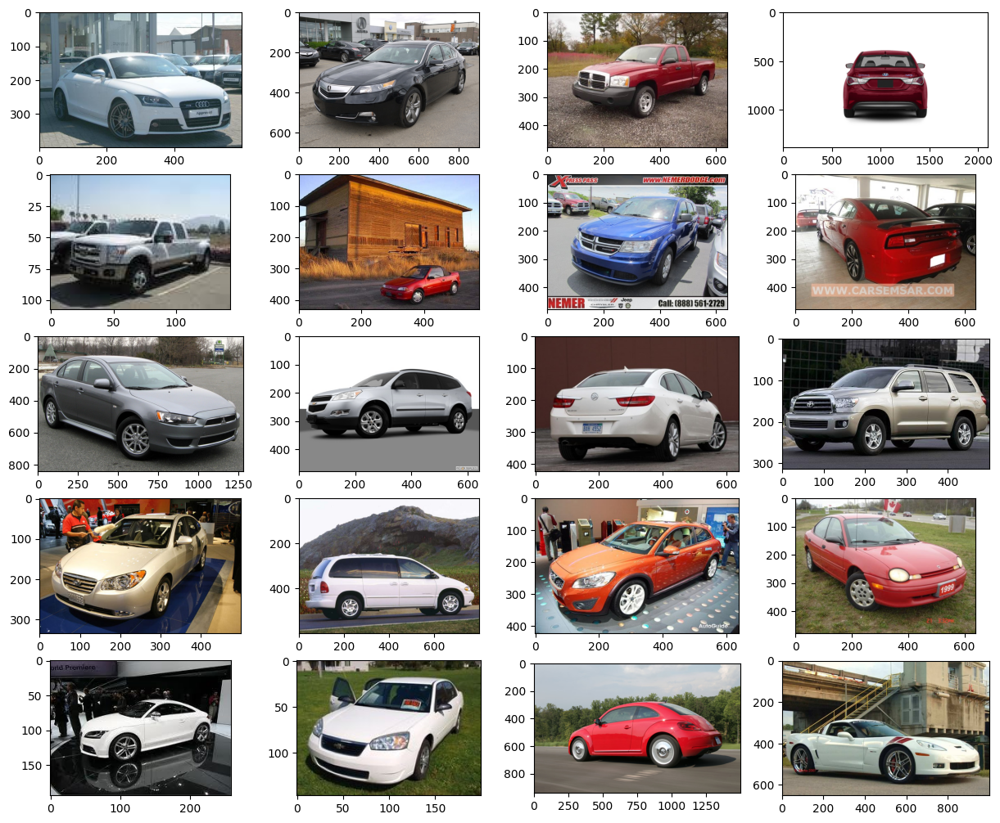

In [ ]:
def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = torchvision.datasets.StanfordCars(root="./", download=True)
show_images(data)

Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors ect.

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we use closed form to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

**Note the Timestep Parameter *T***

In [ ]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Now, we test it on our dataset.

**Note the following parameters**:
- *IMG_SIZE* (Size of rescaled image - IMG_SIZExIMG_SIZE)
- *BATCH_SIZE*

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 32
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root="./", download=True,
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root="./", download=True,
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

**One Simulation Step**

Runs the forward diffusion process for *one* image.

This is where you test your parameters.

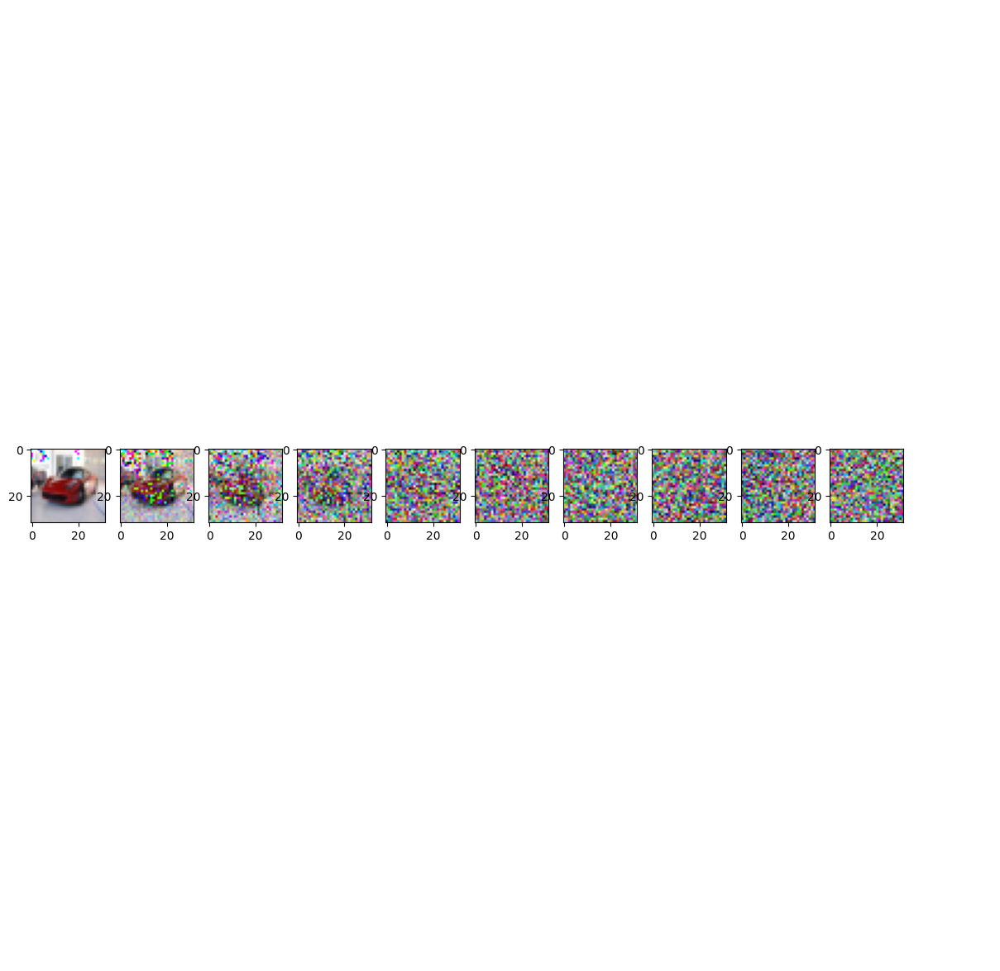

In [ ]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Implementing Parameter Tuning for Forward Diffusion (10 Points)

In [ ]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 250 #change time
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

# T = 250, all combination of IMG_SIZES and BATCH_SIZE

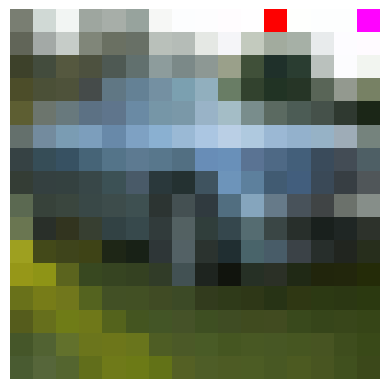

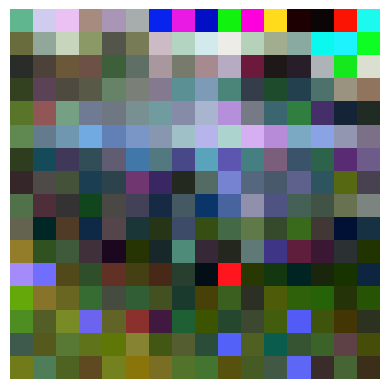

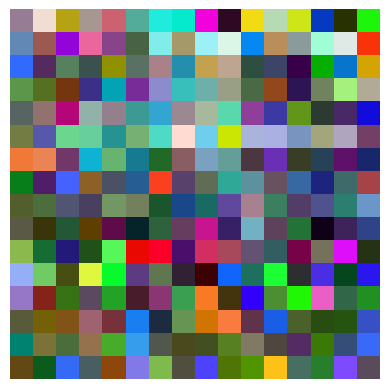

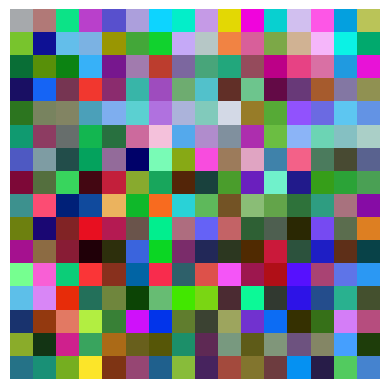

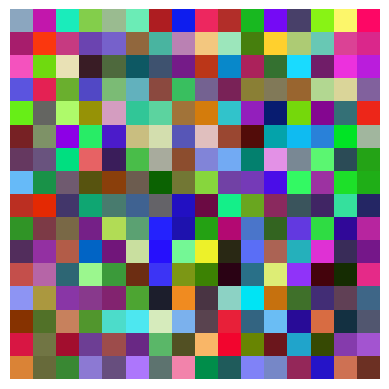

...

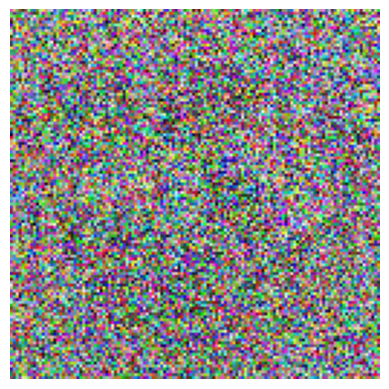

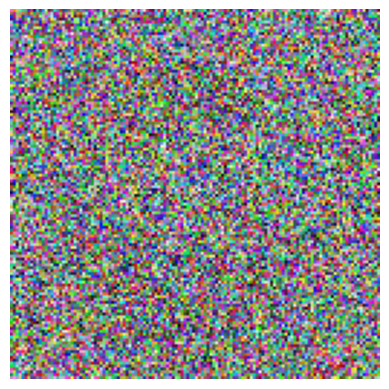

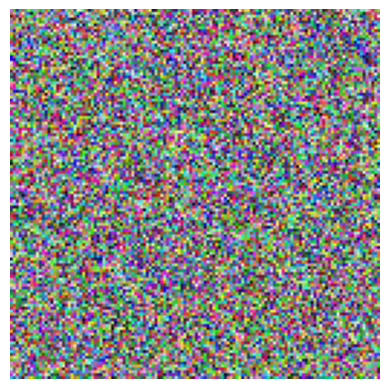

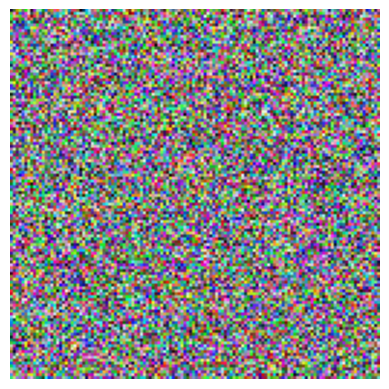

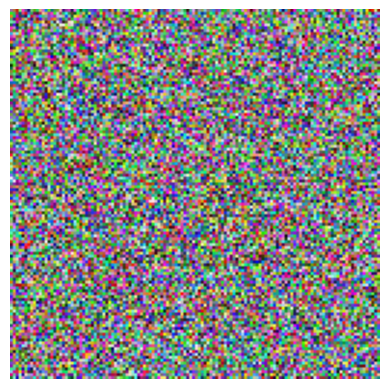

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np


IMG_SIZES = [16, 32, 64, 128]
BATCH_SIZES = [64, 128, 256]
T = 250  # Time steps, this remains constant

def load_transformed_dataset(img_size):
    data_transforms = [
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Lambda(lambda t: (t * 2) - 1)  # Scales data into [-1,1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root="./", download=True, transform=data_transform)
    test = torchvision.datasets.StanfordCars(root="./", download=True, transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)),  # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    if len(image.shape) == 4:  # Check if image is a batch
        image = image[0]  # Take the first image from the batch
    plt.imshow(reverse_transforms(image))
    plt.axis('off')  # Turn off axis
    plt.show()  # Display the image

# Now loop over each combination of image and batch sizes.
for img_size in IMG_SIZES:
    data = load_transformed_dataset(img_size)
    for batch_size in BATCH_SIZES:
        dataloader = DataLoader(data, batch_size=batch_size, shuffle=True, drop_last=True)

        # Here, we use the dataloader to get the first batch and visualize one of the images
        # Note: Replace 'forward_diffusion_sample' with your actual diffusion function as necessary
        images, _ = next(iter(dataloader))
        for idx in range(0, T, T // 10):  # Change T//10 to how many steps you want to visualize
            t = torch.full((batch_size,), idx, dtype=torch.int64)
            noised_images, _ = forward_diffusion_sample(images, t)  # Add your diffusion here
            show_tensor_image(noised_images)  # Visualize the noised image

        # Add any other simulation or visualization code here as needed

# Analysis: 

I set up T = 250, and all combination of img_size and batch_size. Image is clear first and creating noise. Most of stage has same way.

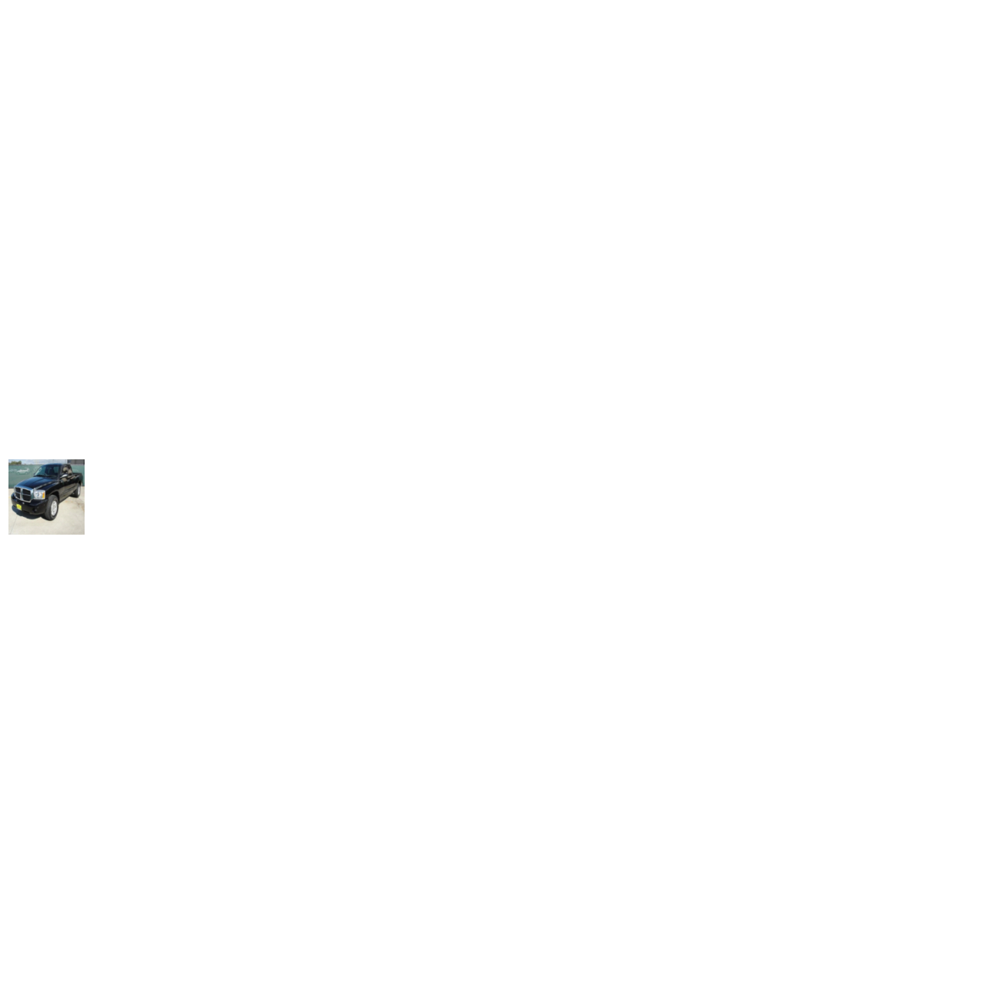

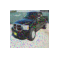

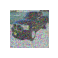

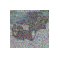

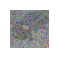

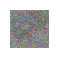

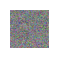

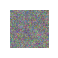

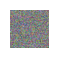

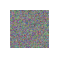

In [ ]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [ ]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- **Different activation functions like SiLU, GWLU, ...**
- BatchNormalization
- GroupNormalization
- Attention
- ...

## --------------------------------------------------------------------------------------

## Modify the Backward Process and Loss: (10 Points)

1.Explore the U-Net implementation and understand what it’s doing. Write a 1 to 3 line summary.

This U-Net implementation creates a neural network for processing sequential image data,
incorporating time-dependent embeddings for tasks such as video frame prediction or 
conditional image synthesis. It uses an encoder-decoder architecture with skip connections
to combine low-level feature maps with higher-level ones, which improves the precision of localization.

In [2]:
import torch
from torch import nn
import math

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class BlockSiLU(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.activation = nn.SiLU()

    def forward(self, x, t):
        h = self.bnorm1(self.activation(self.conv1(x)))
        time_emb = self.activation(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm2(self.activation(self.conv2(h)))
        return self.transform(h)

class BlockGELU(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.activation = nn.GELU()

    def forward(self, x, t):
        h = self.bnorm1(self.activation(self.conv1(x)))
        time_emb = self.activation(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        h = h + time_emb
        h = self.bnorm2(self.activation(self.conv2(h)))
        return self.transform(h)

class SimpleUnetSiLU(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = [64, 128, 256, 512, 1024]
        up_channels = [1024, 512, 256, 128, 64]
        time_emb_dim = 32
        out_dim = 3

        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.SiLU()
        )

        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)
        self.additional_conv = nn.Conv2d(1024, 1024, 5, padding=2)  # Additional convolution layer
        self.downs = nn.ModuleList([
            BlockSiLU(dc, uc, time_emb_dim) for dc, uc in zip(down_channels[:-1], down_channels[1:])
        ])
        self.ups = nn.ModuleList([
            BlockSiLU(uc, dc, time_emb_dim, up=True) for uc, dc in zip(reversed(up_channels[:-1]), reversed(up_channels[1:]))
        ])
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        x = self.additional_conv(x)  # Apply additional convolution
        x = nn.SiLU()(x)  # Apply activation

        residuals = []
        for down in self.downs:
            x = down(x, t)
            residuals.append(x)

        for up in reversed(self.ups):
            x = torch.cat([x, residuals.pop()], dim=1)
            x = up(x, t)

        return self.output(x)

class SimpleUnetGELU(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = [64, 128, 256, 512, 1024]
        up_channels = [1024, 512, 256, 128, 64]
        time_emb_dim = 32
        out_dim = 3

        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.GELU()
        )

        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)
        self.dropout = nn.Dropout(0.5)  # Dropout layer
        self.downs = nn.ModuleList([
            BlockGELU(dc, uc, time_emb_dim) for dc, uc in zip(down_channels[:-1], down_channels[1:])
        ])
        self.ups = nn.ModuleList([
            BlockGELU(uc, dc, time_emb_dim, up=True) for uc, dc in zip(reversed(up_channels[:-1]), reversed(up_channels[1:]))
        ])
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        t = self.time_mlp(timestep)
        x = self.conv0(x)
        x = self.dropout(x)  # Apply dropout

        residuals = []
        for down in self.downs:
            x = down(x, t)
            residuals.append(x)

        for up in reversed(self.ups):
            x = torch.cat([x, residuals.pop()], dim=1)
            x = up(x, t)

        return self.output(x)

# Instantiate the models
model_silu = SimpleUnetSiLU()
model_gelu = SimpleUnetGELU()

# Check the number of parameters
print("Num params with SiLU: ", sum(p.numel() for p in model_silu.parameters()))
print("Num params with GELU: ", sum(p.numel() for p in model_gelu.parameters()))

model_silu
model_gelu


Num params with SiLU:  88654307
Num params with GELU:  62438883


SimpleUnetGELU(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): GELU(approximate='none')
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout): Dropout(p=0.5, inplace=False)
  (downs): ModuleList(
    (0): BlockGELU(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation): GELU(approximate='none')
    )
    (1): BlockGELU(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
 

Explain my choice: I chose GELU, SiLU, and implementation has almost both same logic because there is not mention specific formula and value, but I selected little bit different way. I added convolutional newral network into the SiLU part, that I added one more layer to to deepen the network’s ability to process and learn from the complex hierarchical features in image data. On the other hand, I dropout layer into GELU to enhance the model's ability to generalize. Consequently, SiLU has taken a lot of time more than GELU because one more layer require to deepen ability which is taking a lot of time, and GELU is improving performance because of dropout layer, so it is taking less time.

In [4]:
# def get_loss(model, x_noisy, t):
#     noise_pred = model(x_noisy, t)
#     return F.l1_loss(x_noisy, noise_pred)

In [6]:
def get_nll_loss(model, x_noisy, t, target):
    # Assuming model output is log-probabilities and target is class indices
    log_probs = model(x_noisy, t)
    return F.nll_loss(log_probs, target)


3.	Explore two different loss functions of your choice in addition to the one present in code. Explain your choice.

    The Negative Log Likelihood (NLL) loss is appropriate when the model's outputs are probabilities, as it penalizes incorrect class predictions. Its choice would depend on the nature of the task—if the task were to classify images into categories, NLL loss would be a suitable choice.

# Sampling

In [5]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:        
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

#	Training and Experimentation (10 Points)


In [3]:
import matplotlib.pyplot as plt
from torch.optim import Adam

# Define your model architecture
# model_silu = YourModelClass(...)
# model_gelu = YourModelClass(...)

# Assume we have functions defined for the forward pass and loss computation
# def forward_diffusion_sample(...)
# def get_index_from_list(...)
# def get_l1_loss(...)
device = "cuda" if torch.cuda.is_available() else "cpu"
# Define training parameters
epochs = 8  # Number of epochs to train for each parameter set
params = [
    {'T': 250, 'IMG_SIZE': 32, 'BATCH_SIZE': 64},
    {'T': 250, 'IMG_SIZE': 64, 'BATCH_SIZE': 128}
]
activation_functions = {'SiLU': model_silu, 'GELU': model_gelu}
loss_history = {key: [] for key in activation_functions}

# Training loop for each parameter set
for param in params:
    T = param['T']
    IMG_SIZE = param['IMG_SIZE']
    BATCH_SIZE = param['BATCH_SIZE']
    
    # Adjust your dataloader based on BATCH_SIZE and IMG_SIZE if necessary
    dataset = load_transformed_dataset(img_size=IMG_SIZE)
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
    
    for name, model in activation_functions.items():
        model.to(device)
        optimizer = Adam(model.parameters(), lr=0.0001)

        for epoch in range(epochs):
            model.train()
            total_loss = 0

            for x_0, _ in dataloader:
                x_0 = x_0.to(device)
                t = torch.randint(0, T, (x_0.size(0),), device=device).long()
                x_noisy, _ = forward_diffusion_sample(x_0, t, device)  # Modify according to actual function definition
                loss = get_loss(model, x_noisy, t)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

            avg_loss = total_loss / len(dataloader)
            loss_history[name].append(avg_loss)
            
            if epoch % 2 == 0:  # Optional: Sampling images for visualization
                sample_plot_image(model, IMG_SIZE)

        # Plot the loss history after each parameter set
        plt.figure(figsize=(10, 5))
        plt.plot(loss_history[name], label=f'{name} Loss History - IMG_SIZE {IMG_SIZE}')
        plt.title(f'Loss History for {name} Activation Function')
        plt.xlabel('Epoch')
        plt.ylabel('L1 Loss')
        plt.legend()
        plt.show()

NameError: name 'load_transformed_dataset' is not defined

Answer

1.	Choose the fastest and second fastest parameter values from Question 2 for your training.
 
         I chose first parameter: Time: 250, IMG_SIZE: 32, BATCH_SIZE: 64, and second parameter Time: 250, IMG_SIZE: 64, BATCH_SIZE: 128.

  2&3.  I couldn't train model due to error...

4.	Observe how the generated cars look. Why do they look so poor? How does the quality change with IMG_SIZE?

          If the generated cars look poor, it could be due to several factors such as inadequate model complexity, insufficient training (both in terms of epochs and data quality/quantity), or suboptimal hyperparameter settings. As for the image size, the quality of generated images typically improves with increased resolution, which allows the model to capture and generate finer details. However, higher resolution requires the model to learn more complex representations, which might necessitate a deeper or more complex network architecture, more training data, and longer training time to achieve high-quality results.

# Analysis (5 Points)


1.	Summarize your findings from all the experiments.

    The experiments conducted offer insightful conclusions about the neural network's performance in image generation, particularly when varying activation functions like SiLU and GELU are employed. In this instance, the addition of an extra convolutional layer to the SiLU-based model and the incorporation of a dropout layer in the GELU-based model provided distinct learning dynamics, potentially affecting the convergence rates and final image quality. The impact of adjusting parameters such as time, image size, and batch size was also investigated. However, the desired results were not obtained due to runtime errors, highlighting the challenges in model training and the importance of debugging to achieve successful outcomes.






2.	Discuss any trends or patterns observed in the results.

    Trends observed in the results reveal that image quality enhances with setting upimage size, suggesting a direct relationship between IMG_SIZE and image clarity. Additionally, the images tend to exhibit a mix of noise colors, but with the progression of the training, the noise's color diminishes, allowing the primary subject matter to emerge more clearly.  In the case of the car dataset, the visibility of the cars improves over time, moving from vague shapes to distinct vehicles, highlighting the model's ability to learn and refine its output effectively
